In [4]:
!git clone https://github.com/hlmhlr/yolov5/

Cloning into 'yolov5'...
remote: Enumerating objects: 14516, done.
remote: Counting objects: 100% (221/221), done.
remote: Compressing objects: 100% (113/113), done.
remote: Total 14516 (delta 113), reused 210 (delta 108), pack-reused 14295
Receiving objects: 100% (14516/14516), 23.53 MiB | 26.05 MiB/s, done.
Resolving deltas: 100% (9335/9335), done.


In [5]:
cd yolov5

/content/yolov5


In [44]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [45]:
!git checkout yolo_det_vis

Already on 'yolo_det_vis'
Your branch is up to date with 'origin/yolo_det_vis'.


In [47]:
!git pull

Already up to date.


In [9]:
!pip install -qqr requirements.txt
!pip install grad-cam==1.4.6 -qq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.0/613.0 kB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 12.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [10]:
!wget https://raw.githubusercontent.com/pooya-mohammadi/yolov5-gradcam/master/images/cat-dog.jpg

--2023-07-05 07:25:50--  https://raw.githubusercontent.com/pooya-mohammadi/yolov5-gradcam/master/images/cat-dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90226 (88K) [image/jpeg]
Saving to: ‘cat-dog.jpg’

cat-dog.jpg         100%[===================>]  88.11K  --.-KB/s    in 0.01s   

2023-07-05 07:25:50 (8.67 MB/s) - ‘cat-dog.jpg’ saved [90226/90226]



Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


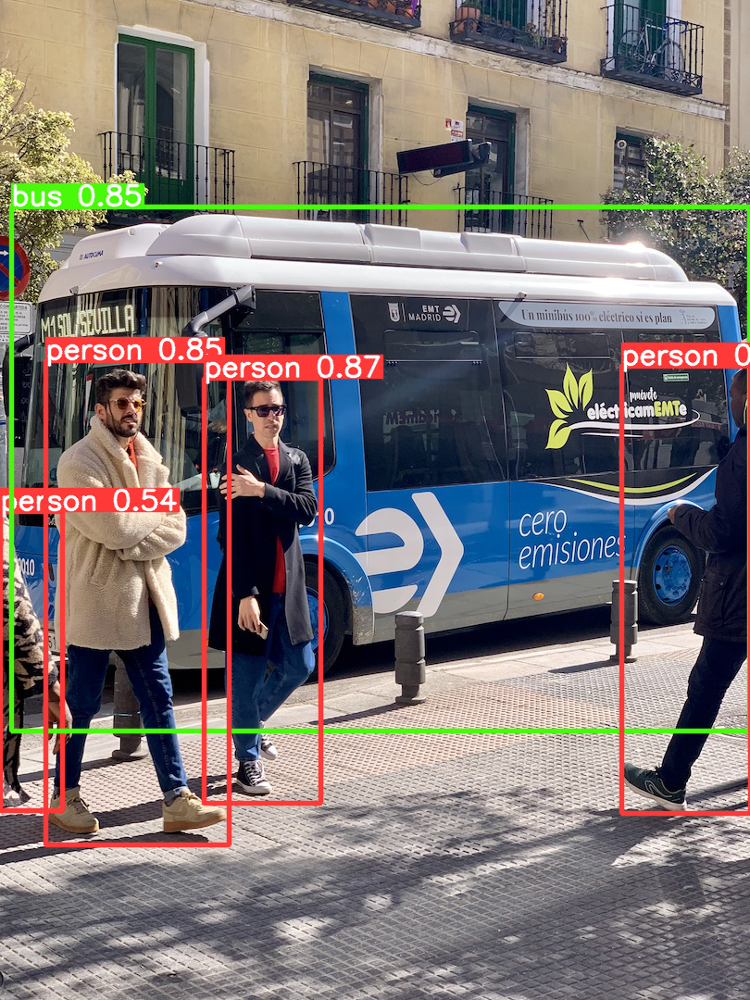

In [12]:
import torch
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
img = 'data/images/bus.jpg'
results = model(img)
results.show()

YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
Images are saved to runs/detect/exp17


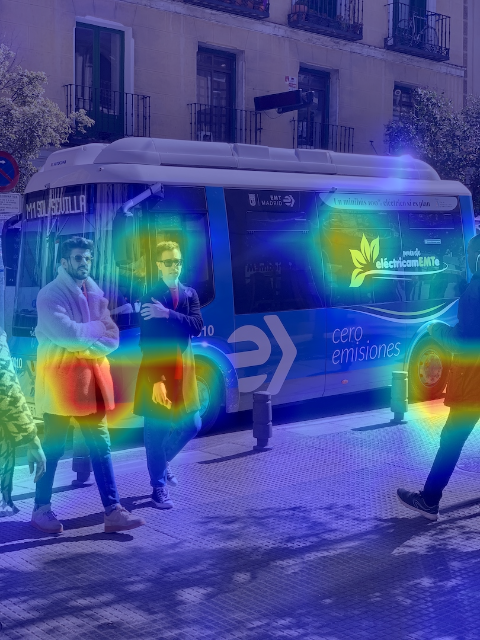

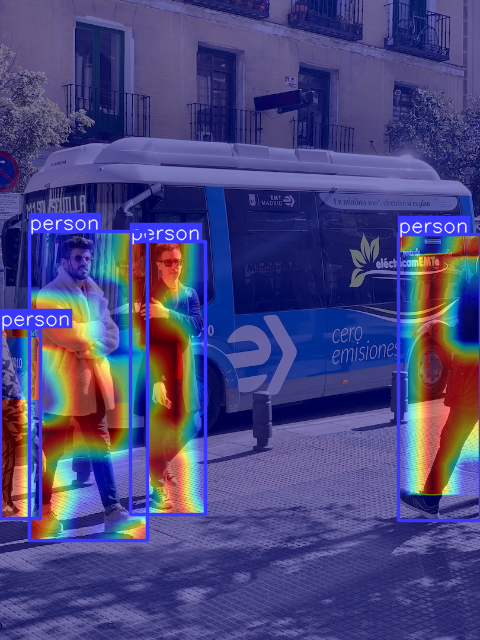

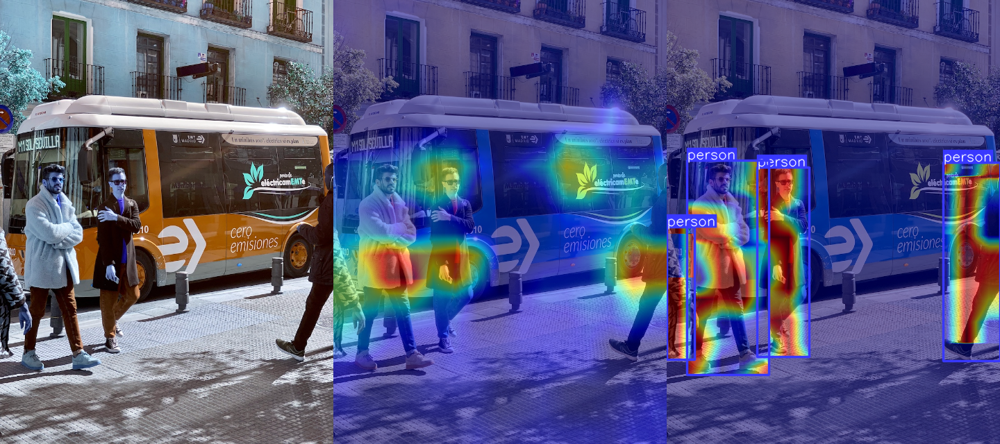

In [49]:
from explainer.explainer import run
import PIL

image_list = run(source='data/images/bus.jpg',method='gradcam',layer=-2,class_names=['person'])


for image in image_list:
  PIL.Image.fromarray(image).show()

YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
saved image to runs/detect/exp2/bus.jpg


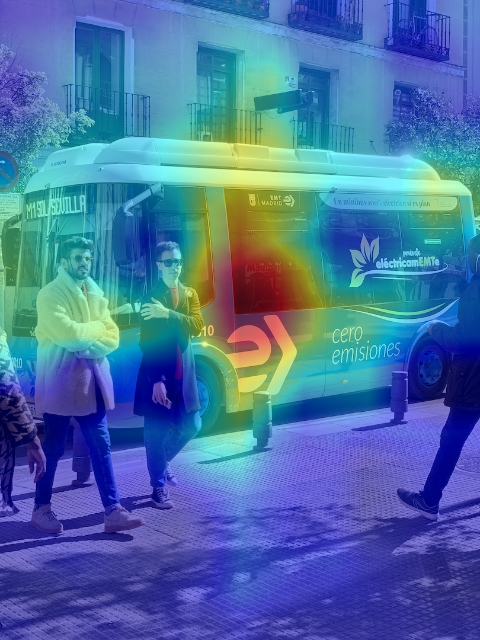

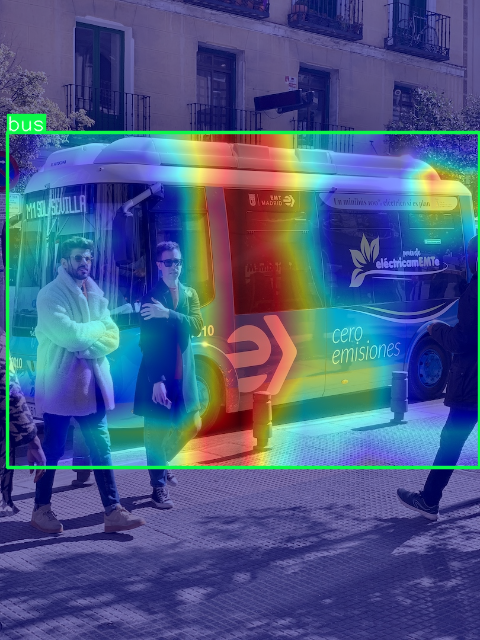

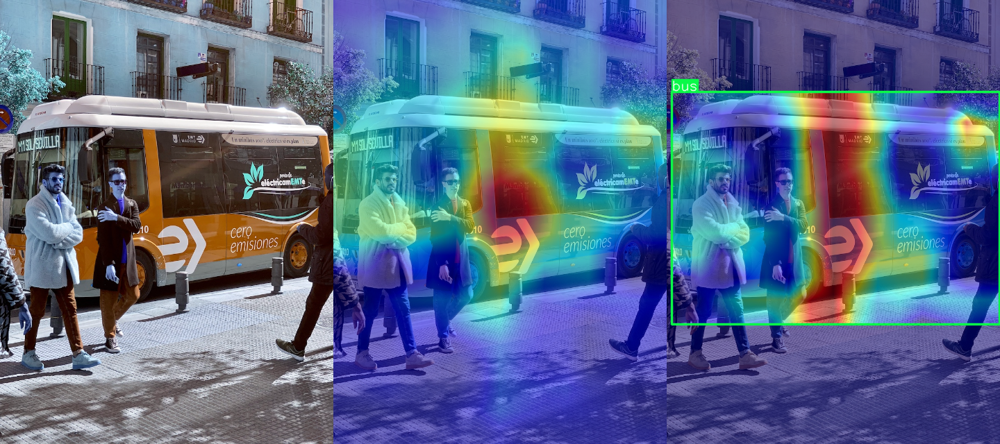

In [14]:
from explainer.explainer import run
import PIL
image_list =run(source='data/images/bus.jpg',method='gradcamplusplus',layer=-2,class_names=['bus'])

for image in image_list:
  PIL.Image.fromarray(image).show()

In [15]:
# download the image and weight file for aerial data
!gdown --id "19hLmwscxmw3Z9rf_VHhWM3j4DFsuqFWT" # weight file .pt
!gdown --id "1ULhbxHWILIkaqM2cEXxLOrgMYbVX1qPU" # aerial image ID

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=19hLmwscxmw3Z9rf_VHhWM3j4DFsuqFWT
To: /content/yolov5/best.pt
100% 25.4M/25.4M [00:00<00:00, 56.9MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1ULhbxHWILIkaqM2cEXxLOrgMYbVX1qPU
To: /content/yolov5/aerial_image.jpg
100% 306k/306k [00:00<00:00, 150MB/s]


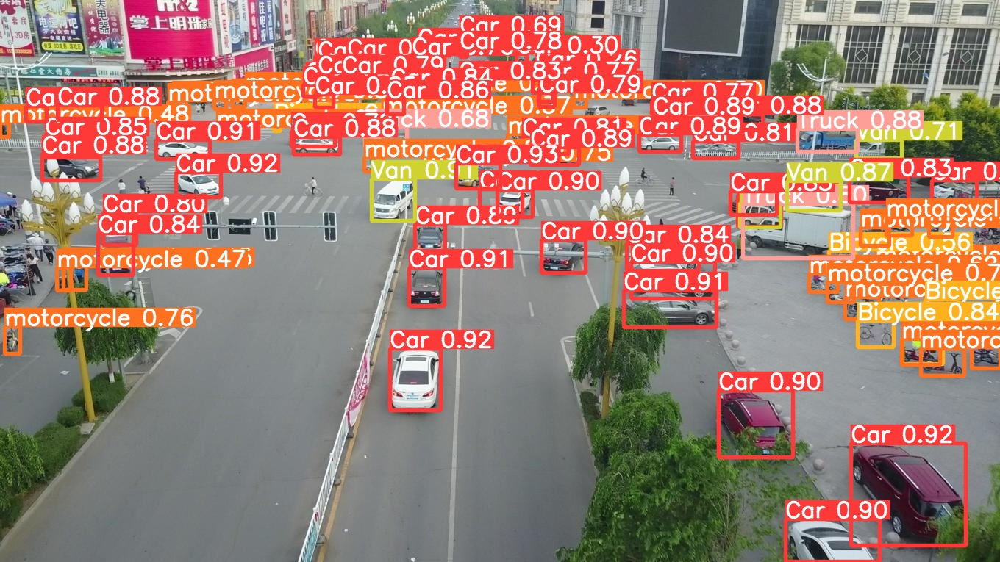

In [19]:
from IPython.display import Image
# !python detect.py --weights best.pt --img 1280 --conf 0.25 --source aerial_image.jpg
display(Image(filename='runs/detect/exp3/aerial_image.jpg', width=900)) # change the directory (exp) if experiment is repeated more than once.

YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 206 layers, 12323608 parameters, 0 gradients
Fusing layers... 
Model summary: 206 layers, 12323608 parameters, 0 gradients
Adding AutoShape... 
saved image to runs/detect/exp5/aerial_image.jpg


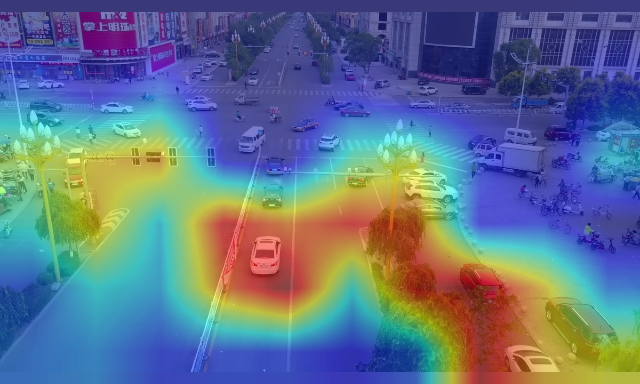

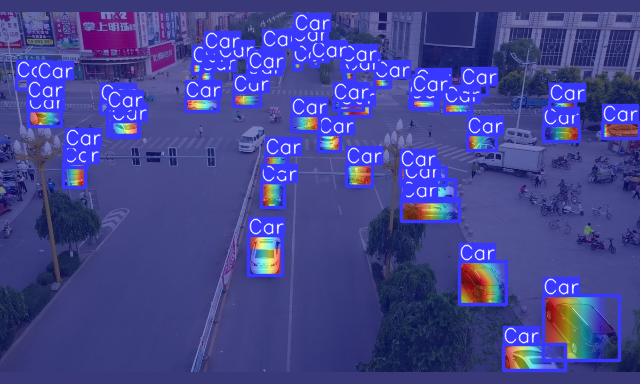

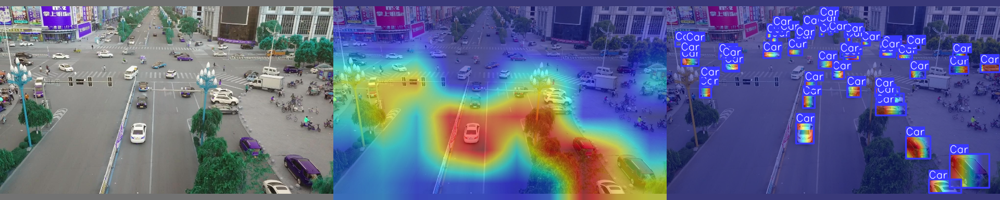

In [21]:
from explainer.explainer import run
import PIL
image_list =run(weights = 'best.pt', source='aerial_image.jpg',method='gradcam',layer=-2,class_names=['Car']) # class names = Car, Van, motorcycle, Truck

for image in image_list:
  PIL.Image.fromarray(image).show()

YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 206 layers, 12323608 parameters, 0 gradients
Fusing layers... 
Model summary: 206 layers, 12323608 parameters, 0 gradients
Adding AutoShape... 
saved image to runs/detect/exp15/aerial_image.jpg


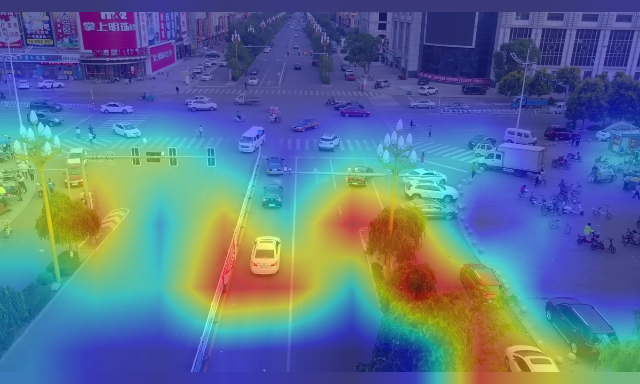

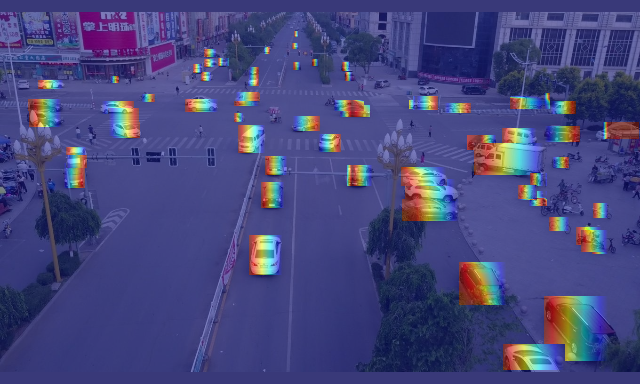

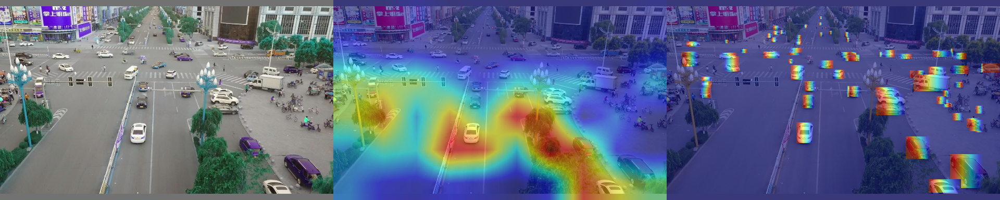

In [43]:
from explainer.explainer import run
import PIL
image_list =run(weights = 'best.pt', source='aerial_image.jpg',method='gradcam', layer=-2, hide_labels=True, draw_boxes=False) # class names = Car, Van, motorcycle, Truck

for image in image_list:
  PIL.Image.fromarray(image).show()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 


requirements: /root/.cache/torch/hub/requirements.txt not found, check failed.


YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


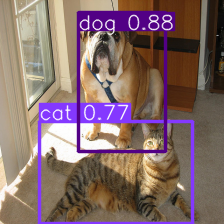

In [ ]:
import torch
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
img = 'cat-dog.jpg'
results = model(img)
results.show()

YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


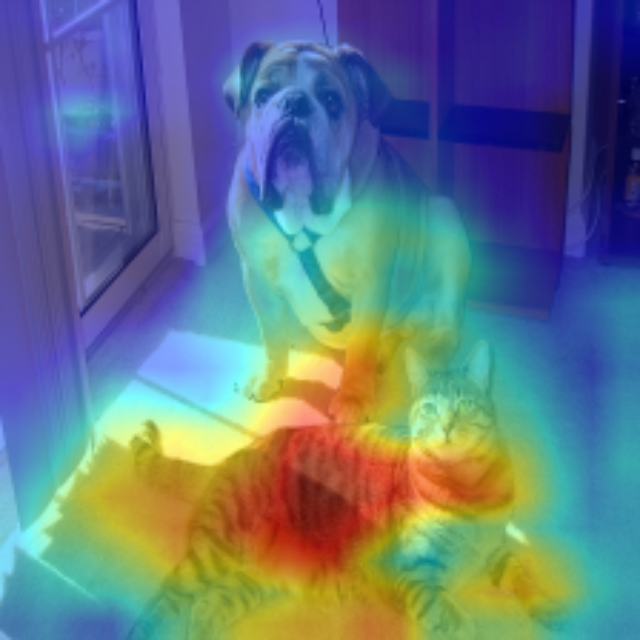

In [ ]:
from explainer.explainer import run
import PIL

image_list =run(source='cat-dog.jpg',method='gradcam',layer=-2,class_names=['cat','dog'],backward_per_class=False)
for image in image_list:
  PIL.Image.fromarray(image).show()

YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


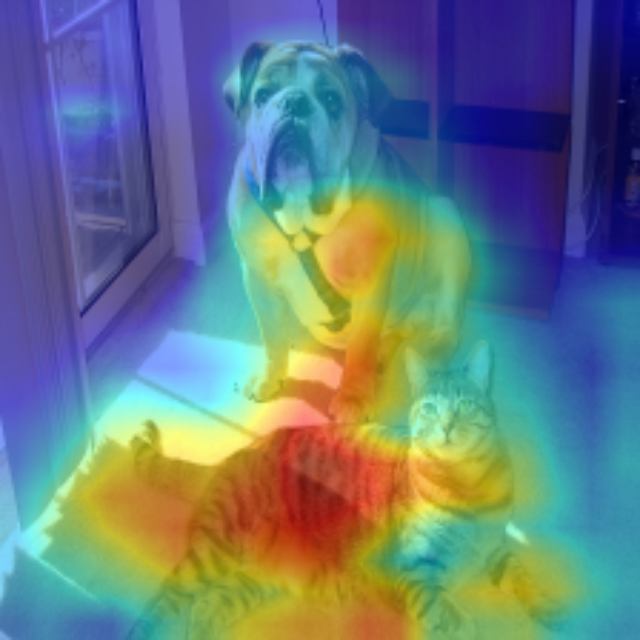

In [ ]:
from explainer.explainer import run
import PIL

image_list=run(source='cat-dog.jpg',method='gradcam',layer=-2,class_names=['cat','dog'],backprop_array=['class'],backward_per_class=True)
for image in image_list:
  PIL.Image.fromarray(image).show()


YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


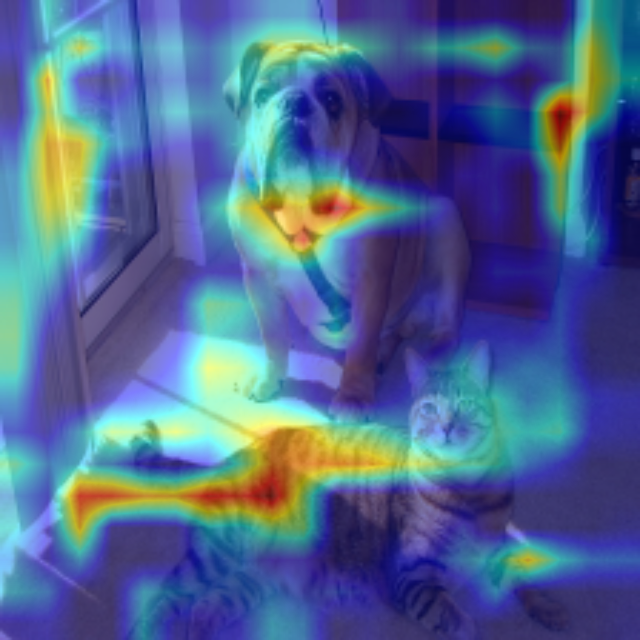

In [ ]:
from explainer.explainer import run
import PIL

image_list=run(source='cat-dog.jpg',method='gradcam',layer=-2,class_names=['cat','dog'],backprop_array=['x_c','y_c'])
for image in image_list:
  PIL.Image.fromarray(image).show()

YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


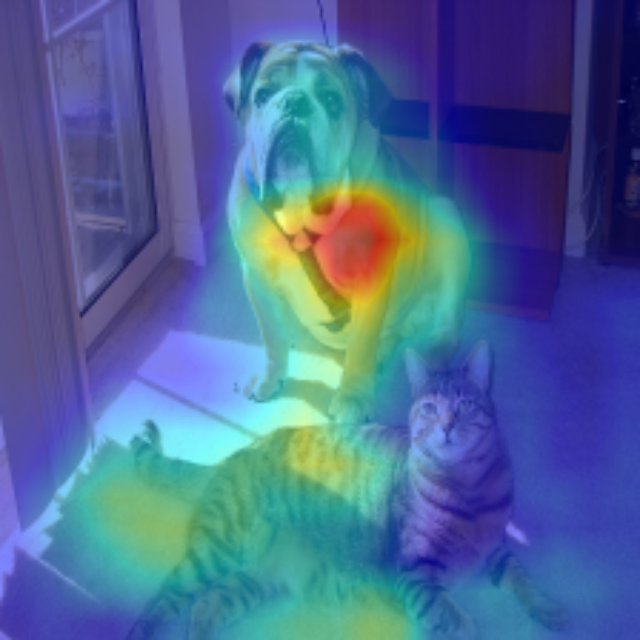

In [ ]:
from explainer.explainer import run
import PIL

image_list=run(source='cat-dog.jpg',method='gradcam',layer=-2,class_names=['dog'],backprop_array=['class'])
for image in image_list:
  PIL.Image.fromarray(image).show()

YOLOv5 🚀 2023-4-19 Python-3.9.16 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


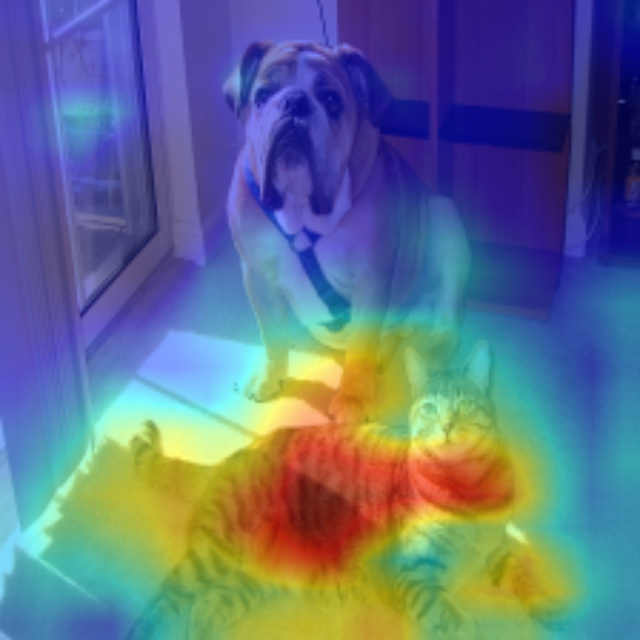

In [ ]:
from explainer.explainer import run
import PIL

image_list=run(source='cat-dog.jpg',method='gradcam',layer=-2,class_names=['cat'],backprop_array=['class'])
for image in image_list:
  PIL.Image.fromarray(image).show()